# Exercise 10: Image stitching

## Helper functions

In [1]:
import numpy as np
import cv2 
import os
import scipy
import matplotlib.pyplot as plt
import matplotlib
import skimage

def load_im(path : str) -> np.ndarray:
    """
        Returns:
            Image scaled to float.
    """
    im = cv2.imread(path)[:, :, ::-1]
    im = im.astype(np.float64) / 255
    
    return im


def pi(points : np.ndarray) -> np.ndarray:
    """
        Converts from homogeneous to inhomogeneous coordinates
    """
    p = points[:-1]/points[-1]
    
    return p


def piInv(points : np.ndarray) -> np.ndarray:
    """
        Converts from inhomogeneous to homogeneous coordinates
    """
    
    # Gets the amount of points by using shape
    _, num_points = points.shape
    
    # Stacks the scale s at the bottom of the matrix
    ph = np.vstack((points, np.ones(num_points)))
    
    return ph


def projectPoints(K, Rt, Q):
    
    Q_hom = piInv(Q)
    points = K @ Rt @ Q_hom
    points_inhom = pi(points)
    
    return points_inhom


def hest(q1, q2) -> np.ndarray:
    """
        Takes two points in 2D and returns the estimated homography matrix.
    """
    
    if len(q1) != len(q2):
        raise ValueError("There must be an equal amount of points in the two sets!")
    
    Bi = []
    for i in range(q1.shape[1]):
        qi = q1[:,i]   # <-- getting the first column
        
        # Creating that weird qx matrix for the Kronecker product
        q1x = np.array(
            [[0,        -1, qi[1]],
             [1,        0, -qi[0]],
             [-qi[1], qi[0], 0]]
        )
        
        q2t_hom = q2[:, i].reshape(-1, 1) # <-- getting the first column and reshaping does for dim: (1, ) -> (1,1)
        Bi.append(np.kron(q2t_hom.T, q1x)) # <-- formula follows that of week 2, slide 56
        # print(np.kron(q2t_hom.T, q1x).shape)
       
    B = np.concatenate(Bi, axis=0)
    
    # Some TA prooved that it was unneseccary to find their dot product
    #BtB = B.T @ B
    V, Lambda, Vt = np.linalg.svd(B)
    Ht = Vt[-1, :]
    
    Ht = np.reshape(Ht, (3, 3))
    H = Ht.T
    
    return H
    
    
def crossOp(p : np.ndarray) -> np.ndarray:
    """
        One of Them weird functions. It takes in a 3D vector and then returns
        some gnarly matrix.
    """
    p = p.flatten()
    if p.size != 3:
        raise Exception("Invalid input, vector must be exactly 3D.")
    
    x, y, z = p
    px = np.array(
        [[0, -z, y],
         [z, 0, -x],
         [-y, x, 0]]
    )
    
    return px


def computeFundamentalMatrix(K1 : np.ndarray, K2 : np.ndarray, R2 : np.ndarray, t2 : np.ndarray) -> np.ndarray:
    """
        Computing the fundamental matrix between two camera matrices K1 & K2.
    """
    t2x = crossOp(t2)

    E = t2x @ R2

    K1inv = np.linalg.inv(K1)
    K2inv = np.linalg.inv(K2)

    F = K1inv.T @ E @ K2inv
    
    return F


def fancyRotate(theta_x, theta_y, theta_z):
    """
        Does the rotation matrix that we have seen a few times.
        E.g. Exercises week 4, eq(12).
    """
    from scipy.spatial.transform import Rotation
    
    R = Rotation.from_euler("xyz", [theta_x, theta_y, theta_z]).as_matrix()
    
    return R


def in_frame(l, l_im, shape):
    """
        I think this checks whether the line is within the image
    """
    q = np.cross(l.flatten(), l_im)
    q = q[:2]/q[2]
    if all(q >= 0) and all(q+1 <= shape[1::-1]):
        return q
  
    
def DrawLine(l, shape):
    """
        Checks where the line intersects the four sides of the image
        and finds the two intersections that are within the frame
    """
    lines = [[1, 0, 0], [0, 1, 0], [1, 0, 1-shape[1]], [0, 1, 1-shape[0]]]
    P = [in_frame(l, l_im, shape) for l_im in lines if in_frame(l, l_im, shape) is not None]
    plt.plot(*np.array(P).T)


def draw_line_Vitus(line: np.ndarray, tau: float):
    """
        Draws a line with a width of tau.
        
        Takes:
            :param line: The line to be drawn
            :param tau: The distance from the line to be drawn
        
        Returns:
            :return: None
    """
    
    x1, x2 = plt.gca().get_xlim()
    y1 = -(line[0]*x1 + line[2]) / line[1]
    y2 = -(line[0]*x2 + line[2]) / line[1]
    y1_low = -(line[0]*x1 + line[2] + tau) / line[1]
    y1_high = -(line[0]*x1 + line[2] - tau) / line[1]
    y2_low = -(line[0]*x2 + line[2] + tau) / line[1]
    y2_high = -(line[0]*x2 + line[2] - tau) / line[1]
    
    plt.axline((x1,y1), (x2,y2), c='black')
    plt.axline((x1,y1_low), (x2,y2_low), c='black', linestyle='dashed')
    plt.axline((x1,y1_high), (x2,y2_high), c='black', linestyle='dashed')
    



## Ex 10.1

Find SIFT keypoints (`kp1, kp2`) in both images and compute their descriptors (`des1, des2`). 

Mathc the SIFT features from both images to each other. Make sure to use cross checking.

### Response

In [2]:
# Loading in images (both as normal numpy and as cv2)
PATH = "../Data/Week_10"

im1 = load_im(PATH + "/im1.jpg")
im2 = load_im(PATH + "/im2.jpg")

im1_cv = cv2.imread(PATH + "/im1.jpg")
im2_cv = cv2.imread(PATH + "/im2.jpg")

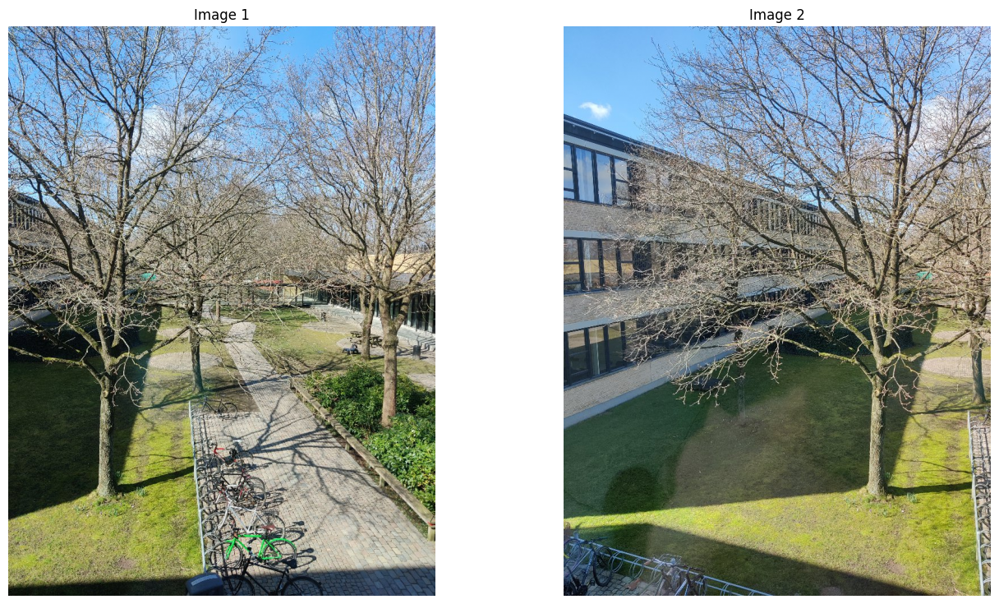

In [3]:
plt.figure(figsize=(16, 9))
plt.subplot(1, 2, 1)
plt.title("Image 1")
plt.axis("off")
plt.imshow(im1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Image 2")
plt.axis("off")
plt.imshow(im2, cmap="gray")

plt.show()

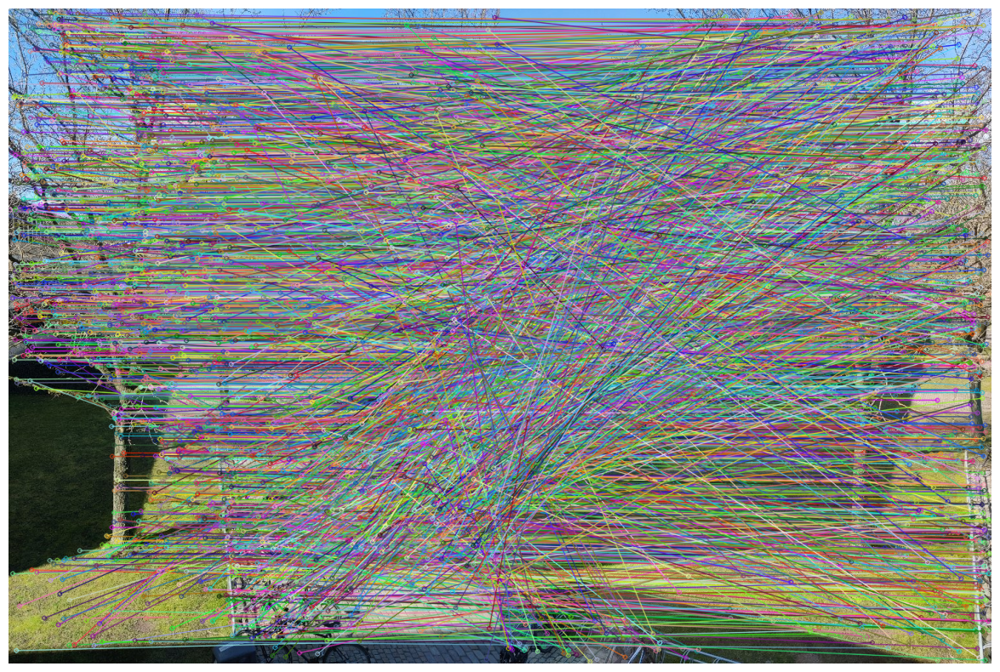

In [4]:
# Initiate SIFT detector
sift = cv2.SIFT_create()

# NOTE: It is necessary to load images with cv2 if you intend to find SIFT features!
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1_cv, None)
kp2, des2 = sift.detectAndCompute(im2_cv, None)

# BFMatcher with default params
bf = cv2.BFMatcher_create(crossCheck = True)

matches = bf.knnMatch(des1, des2, k=1)  # <-- k = 2 gives bugs

im_sift = cv2.drawMatchesKnn(im1_cv, kp1, im2_cv, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)[:,:,::-1]

fig = plt.figure(figsize=(20,10))
plt.axis("off")
plt.imshow(im_sift)
plt.show()

## Ex 10.2

Implement a RANSAC algorithm for finding the homography between `im1` and `im2`.

What is the minimum number of matches you need to estimate a homography? (Tip: it’s four).

Explain why this is the case.

Use Equation (2.45) from the lecture notes to compute the distance of a match to a homography.

$$
    \text{dist}_{app} = (\pmb{H}, \pmb{p}_{1i}, \pmb{p}_{2i}) =
    || \Pi (\pmb{H} \bullet \pmb{p}_{2i}) - \Pi (\pmb{p}_{1i}) ||_2^2 + || \Pi (\pmb{H}^{-1} \bullet \pmb{p}_{1i}) - \Pi (\pmb{p}_{2i}) ||_2^2
$$

Assume σ = 3 and use the formulas from the lecture last week to determine the threshold for when a match should be considered an inlier.

While best practice would be to determine the number of iterations while running the algorithm, you can fix it to i.e. 200.

To verify that the inliers of the best model are reasonable, visualize them. Consider using the following code:

`plt.imshow(cv2.drawMatches(im1, kp1, im2, kp2, np.array(matches)[bestInliers], None))`

On the provided images you should find in the ballpark of a thousand inliers.

### Response

In [12]:
def dist_app(H : np.ndarray, p1 : np.ndarray, p2 : np.ndarray) -> float:
    """
        Error measure for points calculated by equation 2.45 of lecture notes.
        
        Takes:
            :param H: The homography matrix between the two planes corresponding to the two set of points
            :param p1: Points from image (plane) 1
            :param p2: Points from image (plane) 2
        
        Returns:
            :return: The error measure between points p1 and p2. 
    """
    
    H_inv = np.linalg.inv(H)
    
    alpha = pi(H @ p2.T) - pi(p1)
    beta = pi(H_inv @ p1.T) - pi(p2)
    
    dist = alpha @ alpha + beta @ beta
    
    return dist
    
    
def RANSAC_H(N : int, p1 : np.ndarray, p2 : np.ndarray) -> np.ndarray:
    """
        RANSAC for homography matrix estimation
        
        Takes:
            :param N: Number of iterations
            :param p1: Points from image 1
            :param p2: Points from image 2
        
        Returns:
            :return: The best estimate of homography matrix
    """
    
    MIN_MATCHES = 4
    
    M = len(p1)
    match_idx = np.arange(M)
    
    # Best number of inliers
    s = 0
    
    tau = 3.84
    sigma = 3
    
    threshold = tau * sigma**2
    
    H_best = None
    mask_best = None
    
    p1_hom = piInv(p1.T)
    p2_hom = piInv(p2.T)
    
    for _ in range(N):
        
        pick = np.random.choice(match_idx, MIN_MATCHES, replace=False)

        ps = piInv(p1[pick, :].T)
        qs = piInv(p2[pick, :].T)
        
        # Estimate homography matrix with the function we wrote in week 4
        H = hest(ps, qs)
        
        mask = [dist_app(H, p1_hom[:, i], p2_hom[:, i]) < threshold for i in range(M)]
        
        inliers = sum(mask)
        
        if inliers > s:
            s = inliers
            print(f"New best number of inliers: {s}")
            H_best = H
            mask_best = mask
    
    return H_best, mask_best
    
    

In [13]:
# Mikkel's code for getting those points out of matches (very difficult to get it out of him as text)
good = [match for match in matches if match != ()]

p = np.array([kp1[match[0].queryIdx].pt for match in matches if match != ()])
q = np.array([kp2[match[0].trainIdx].pt for match in matches if match != ()])

print(f"shape of p: {p.shape}")
print(f"shape of q: {q.shape}")

NUM_ITERATIONS = 200

H_est, inlier_mask = RANSAC_H(NUM_ITERATIONS, p, q)

shape of p: (2400, 2)
shape of q: (2400, 2)
New best number of inliers: 4
New best number of inliers: 577
New best number of inliers: 936
New best number of inliers: 948


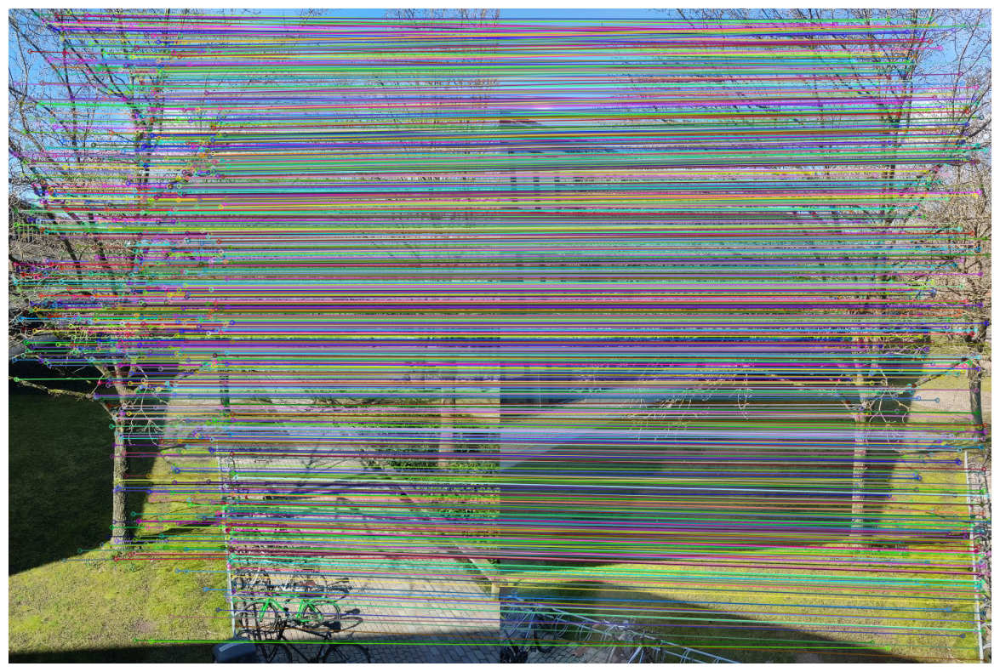

In [14]:
matches_masked = [match for match, mask in zip(good, inlier_mask) if mask]

im_sift2 = cv2.drawMatchesKnn(im1_cv, kp1, im2_cv, kp2, matches_masked, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)[:,:,::-1]

fig = plt.figure(figsize=(20,10))
plt.axis("off")
plt.imshow(im_sift2)
plt.show()

## Ex 10.3

Wrap your code from the previous exercise in a function:

`H = estHomographyRANSAC(kp1, des1, kp2, des2)`

The function should take SIFT keypoints and descriptors computed on two images and use RANSAC to estimate the best homography between the images.

Make sure that the function ends with fitting a homography to the largest amount of inliers.



### Response

In [15]:
def est_homography_RANSAC(N : int, kp1 : tuple, des1 : np.ndarray, kp2 : tuple, des2 : np.ndarray) -> np.ndarray:
    """
        Estimate the homography using SIFT keypoints and descriptors by RANSAC
        
        Takes: 
            :param N: Number of iterations
            :param kp1: Keypoints from image 1
            :param des1: Descriptors from image 1
            :param kp2: Keypoints from image 2
            :param des2: Descriptors from image 2
        
        Return:
            :return: The estimated homography matrix
    """
    
    # BFMatcher with default params
    bf = cv2.BFMatcher_create(crossCheck = True)

    matches = bf.knnMatch(des1, des2, k=1)  # <-- k = 2 gives bugs  
    
    # Mikkel's code for getting those points out of matches (very difficult to get it out of him as text)
    p = np.array([kp1[match[0].queryIdx].pt for match in matches if match != ()])
    q = np.array([kp2[match[0].trainIdx].pt for match in matches if match != ()])
    
    MIN_MATCHES = 4
    
    M = len(p)
    match_idx = np.arange(M)
    
    # Best number of inliers
    s = 0
    
    tau = 3.84
    sigma = 3
    
    threshold = tau * sigma**2
    
    H_best = None
    mask_best = None
    
    p_hom = piInv(p.T)
    q_hom = piInv(q.T)
    
    for _ in range(N):
        
        pick = np.random.choice(match_idx, MIN_MATCHES, replace=False)

        ps = piInv(p[pick, :].T)
        qs = piInv(q[pick, :].T)
        
        # Estimate homography matrix with the function we wrote in week 4
        H = hest(ps, qs)
        
        mask = [dist_app(H, p_hom[:, i], q_hom[:, i]) < threshold for i in range(M)]
        
        inliers = sum(mask)
        
        if inliers > s:
            s = inliers
            print(f"New best number of inliers: {s}")
            H_best = H
            mask_best = mask
    
    return H_best, mask_best

New best number of inliers: 5
New best number of inliers: 12
New best number of inliers: 752
New best number of inliers: 792
New best number of inliers: 865


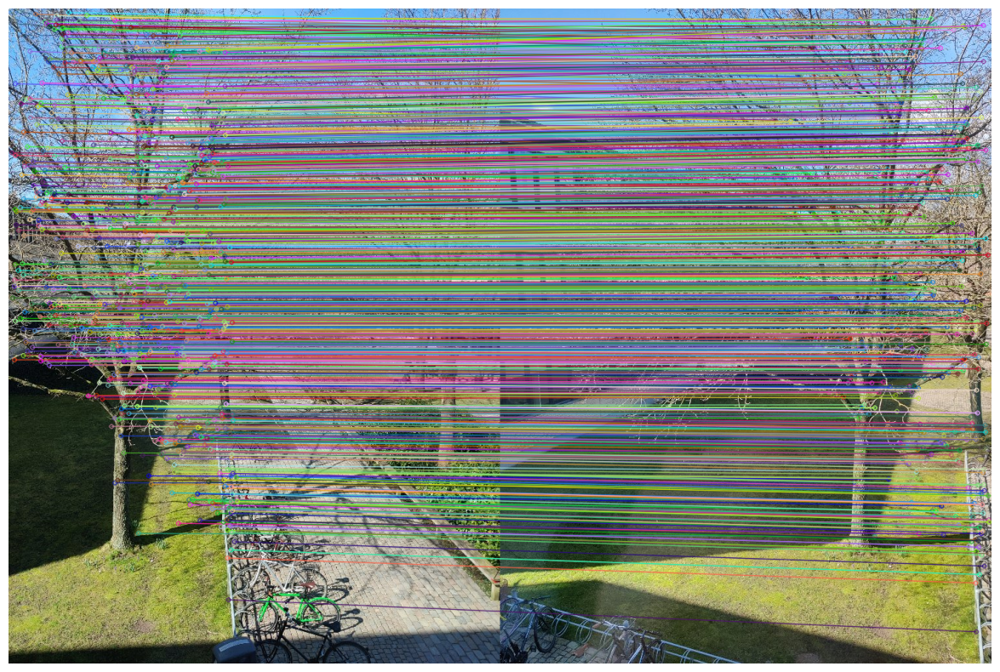

In [16]:
H_est2, inlier_mask2 = est_homography_RANSAC(NUM_ITERATIONS, kp1, des1, kp2, des2)

matches_masked2 = [match for match, mask in zip(good, inlier_mask2) if mask]

im_sift3 = cv2.drawMatchesKnn(im1_cv, kp1, im2_cv, kp2, matches_masked2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)[:,:,::-1]

fig = plt.figure(figsize=(20,10))
plt.axis("off")
plt.imshow(im_sift3)
plt.show()

## Ex. 10.4

Run the function on im1 and im2. You can use the following function for warping the images using
your homography.

```
    def warpImage(im, H, xRange, yRange):
        T = np.eye(3)
        T[:2, 2] = [-xRange[0], -yRange[0]]
        H = T@H
        outSize = (xRange[1]-xRange[0], yRange[1]-yRange[0])
        mask = np.ones(im.shape[:2], dtype=np.uint8)*255
        imWarp = cv2.warpPerspective(im, H, outSize)
        maskWarp = cv2.warpPerspective(mask, H, outSize)
        return imWarp, maskWarp`
```

It takes an image and a homography and returns the image warped with the homography, where `xRange` and `yRange` specifies for which range of `x` and `y` values the image should be sampled. The function returns the transformed version of the image, and a mask that is 1 where the image is valid.

Start out by setting:

```
    xRange = [0, im1.shape[1]]
    yRange = [0, im1.shape[0]]
```

Warp one of your images using the estimated homography. Which image you should warp, depends on if you have found the homography going from image one to two or vice versa. This should warp this image to the other, thus cutting off a lot of the content of that image.

Use the warping function on the other image but set the homography to the identity. Change `xRange` and `yRange` so the images are no longer getting cropped by the warp.

### Response

In [17]:
def warpImage(im, H, xRange, yRange):
    T = np.eye(3)
    T[:2, 2] = [-xRange[0], -yRange[0]]
    H = T @ H
    outSize = (xRange[1] - xRange[0], yRange[1] - yRange[0])
    mask = np.ones(im.shape[:2], dtype=np.uint8)*255
    imWarp = cv2.warpPerspective(im, H, outSize)
    maskWarp = cv2.warpPerspective(mask, H, outSize)
    
    return imWarp, maskWarp

In [ ]:
H_est3, inlier_mask3 = est_homography_RANSAC(NUM_ITERATIONS, kp1, des1, kp2, des2)

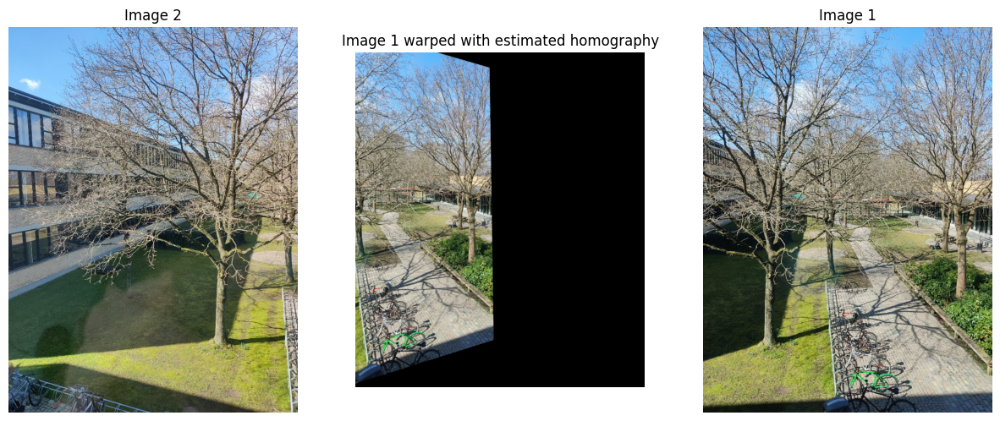

In [32]:
xRange = [-100, im2.shape[1] + 100]
yRange = [0, im2.shape[0] + 100]

imWarp1, maskWarp1 = warpImage(im1, H_est3, xRange, yRange)
imWarp2, maskWarp2 = warpImage(im2, np.eye(3), xRange, yRange)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(15, 10)
axs[0].axis("off")
axs[0].set_title("Image 2")
axs[0].imshow(im2)

axs[1].axis("off")
axs[1].set_title("Image 1 warped with estimated homography")
axs[1].imshow(imWarp1)

axs[2].axis("off")
axs[2].set_title("Image 1")
axs[2].imshow(im1)
plt.show()


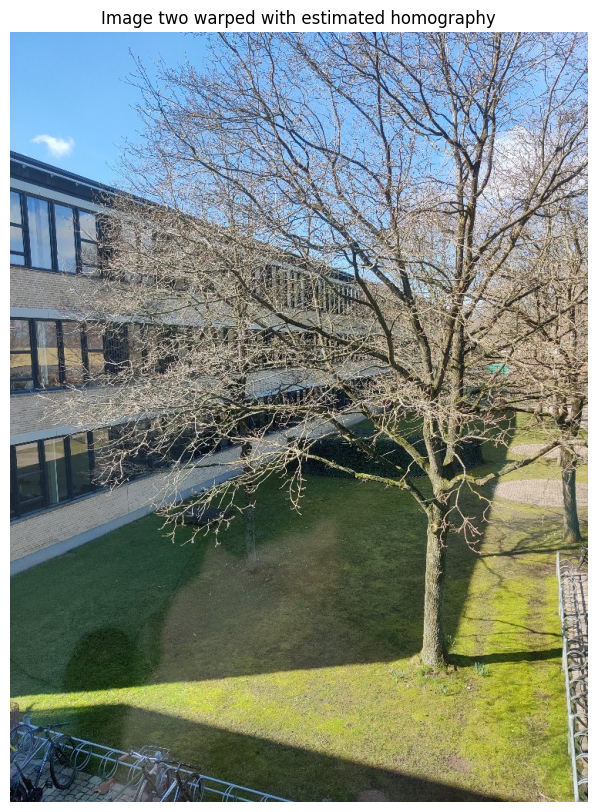

In [21]:
fig = plt.figure(figsize=(20,10))
plt.axis("off")
plt.title("Image two warped with estimated homography")
plt.imshow(imWarp2)
plt.show()

## Ex 10.5

Use the mask returned by the warping function, to generate a single image that contains both images. Where the images overlap you can use the intensities from either image.

### Response

## Optional algorithm improvements
Congratulations! You have now created a panorama! But you can improve your algorithm. Here are some suggestions.